# **Báo cáo đề tài: Object Detection - Phát hiện vật thể**

## **Mục tiêu:**
* Xác định vị trí (Bounding Box) và phân loại nhiều vật thể trong cùng một bức ảnh.

# **Notebook này thực hiện quá trình huấn luyện mô hình phát hiện vật thể trên tập dữ liệu đầy đủ COCO 2017**
* Khác với phiên bản thử nghiệm (chỉ chạy trên tập val2017 5000 ảnh), notebook này sẽ huấn luyện trên toàn bộ tập train2017 với hơb 118k ảnh gốc
* Tập huấn luyện (Training Set): Sử dụng train2017 (~118.000 ảnh, 18GB).
  * Mục đích: Dùng để mô hình học các đặc trưng và cập nhật trọng số
* Tập kiểm định (Validation Set): Sử dụng val2017 (5.000 ảnh, 1GB).
  * Mục đích: Dùng để đánh giá khách quan hiệu suất mô hình (tính điểm mAP) sau mỗi epoch, giúp theo dõi quá trình hội tụ và ngăn chặn hiện tượng học vẹt (overfitting).

## **Kiến trúc mô hình:**
* Backbone (ResNet/FPN): Sử dụng ResNet để trích xuất đặc trưng và FPN (Feature Pyramid Network) để giúp mô hình nhận diện tốt vật thể ở nhiều kích thước khác nhau (lớn và nhỏ).
* Detection Head (YOLOstyle): Phần "đầu" dự đoán được thiết kế theo phong cách của YOLO (You Only Look Once), nổi tiếng với tốc độ xử lý nhanh.
* Bộ dữ liệu: COCO 2017: Hơn 200.000 hình ảnh, 80 danh mục vật thể, gồm:
  * Tập huấn luyện (Train 2017): Khoảng 118.000 ảnh. Dùng để huấn luyện chính cho mô hình.
  * Tập kiểm định (Val 2017): 5.000 ảnh. Dùng để kiểm tra hiệu suất và tinh chỉnh siêu tham số trong quá trình huấn luyện.
  * Tập kiểm thử (Test 2017): Khoảng 41.000 ảnh. Là tập kiểm thử. Do tập test 2017 không công khai nhãn (dùng riêng cho các cuộc thi) nên sẽ dùng tập val 2017 để đánh giá kết quả thực nghiệm
  * Tập chứa dữ liệu nhãn (annotations): Đây là các file định dạng JSON chứa tọa độ khung hình, tên đồ vật cho cả tập train và val. Dùng để đánh giá cuối cùng.

## **Các chỉ số chú ý trong báo cáo**
* mAP (Mean Average Precision): Đây là chỉ số quan trọng nhất để biết mô hình của bạn chính xác đến mức nào trên tất cả các loại vật thể.
* AP50: Độ chính xác khi khung hình chữ nhật của bạn khớp với đáp án ít nhất 50% (IoU > 0.5).
* Visualize: Vẽ các khung hình chữ nhật (bounding boxes) lên ảnh thực tế để kiểm tra bằng mắt thường.



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Step 1: Setup & Connection**

Kết nối với Google Drive để lưu trữ checkpoint và kết quả.
- checkpoints: Thư mục chứa file model (.pth).
- results: Thư mục chứa ảnh dự đoán và biểu đồ loss.

In [ ]:
import os
try:
    from google.colab import drive
    drive.mount('/content/drive')
    print("Da ket noi Google Drive.")

    # Định nghĩa các thư mục lưu trữ
    base_dir = '/content/drive/MyDrive/DL_Object_Detection_Train_18GB'
    checkpoint_dir = os.path.join(base_dir, 'checkpoints')

    os.makedirs(checkpoint_dir, exist_ok=True)
    print(f"Thu muc Checkpoints: {checkpoint_dir}")

except ImportError:
    checkpoint_dir = './checkpoints'
    os.makedirs(checkpoint_dir, exist_ok=True)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Da ket noi Google Drive.
Thu muc Checkpoints: /content/drive/MyDrive/DL_Object_Detection_Train_18GB/checkpoints


# **Step 2: Dataset Preparation - Chuẩn bị dữ liệu**

Tải trực tiếp tập dữ liệu COCO 2017 Validation về môi trường Colab.

In [ ]:
import time

# Thư mục dữ liệu tạm trên SSD của Colab
DATA_ROOT = '/content/coco_data_temp'
os.makedirs(DATA_ROOT, exist_ok=True)
%cd {DATA_ROOT}

print("Dang tai du lieu Train2017 va Val2017")

# 1. Tải file nhãn (Annotations)
if not os.path.exists('annotations_trainval2017.zip'):
    !curl -O http://images.cocodataset.org/annotations/annotations_trainval2017.zip
    !unzip -q annotations_trainval2017.zip

# 2. Tải file ảnh
# Tải tập Train (18GB) dùng để huấn luyện
if not os.path.exists('train2017.zip'):
    print("Dang tai du lieu Train (18GB)...")
    !curl -O http://images.cocodataset.org/zips/train2017.zip
    print("Dang giai nen Train...")
    !unzip -q train2017.zip

# Tải tập Val (1GB) dùng để đánh giá
if not os.path.exists('val2017.zip'):
    print("Dang tai du lieu Val (1GB)...")
    !curl -O http://images.cocodataset.org/zips/val2017.zip
    print("Dang giai nen Val...")
    !unzip -q val2017.zip

print("Du lieu da san sang.")

/content/coco_data_temp
Dang tai du lieu Train2017 va Val2017
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  241M  100  241M    0     0  53.0M      0  0:00:04  0:00:04 --:--:-- 56.5M
Dang tai du lieu Train (18GB)...
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 18.0G  100 18.0G    0     0  43.0M      0  0:07:07  0:07:07 --:--:-- 53.2M
Dang giai nen Train...
Dang tai du lieu Val (1GB)...
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  777M  100  777M    0     0  59.2M      0  0:00:13  0:00:13 --:--:-- 60.7M
Dang giai nen Val...
Du lieu da san sang.


## **Step 2.1: Dataset Exploration (EDA) - Khám phá dữ liệu**


In [ ]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# Cấu hình đường dẫn cho tập Train (Dùng để Train)
ann_file = os.path.join(DATA_ROOT, 'annotations/instances_train2017.json')
img_dir = os.path.join(DATA_ROOT, 'train2017')

# Cấu hình đường dẫn cho tập Val (Dùng để Đánh giá Validate sau mỗi epoch)
val_ann_file = os.path.join(DATA_ROOT, 'annotations/instances_val2017.json')
val_img_dir = os.path.join(DATA_ROOT, 'val2017')

# Kiểm tra file Train
if os.path.exists(ann_file):
    with open(ann_file, 'r') as f:
        coco_data = json.load(f)
    print("Da tai file Annotation JSON (Train) thanh cong!")
else:
    print("Chua tim thay file JSON.")

Da tai file Annotation JSON (Train) thanh cong!


In [ ]:
# 1. Xem các trường thông tin chính (Keys)
print(f"Cac keys trong file JSON: {list(coco_data.keys())}")

Cac keys trong file JSON: ['info', 'licenses', 'images', 'annotations', 'categories']


In [ ]:
# 2. Thống kê số lượng
print(f"Tong so anh (images): {len(coco_data['images'])}")
print(f"Tong so nhan vat the (annotations): {len(coco_data['annotations'])}")

Tong so anh (images): 118287
Tong so nhan vat the (annotations): 860001


In [ ]:
# 3. Danh sách (list) chứa thông tin về tất cả các danh mục vật thể (object categories)
coco_data['categories']

[{'supercategory': 'person', 'id': 1, 'name': 'person'},
 {'supercategory': 'vehicle', 'id': 2, 'name': 'bicycle'},
 {'supercategory': 'vehicle', 'id': 3, 'name': 'car'},
 {'supercategory': 'vehicle', 'id': 4, 'name': 'motorcycle'},
 {'supercategory': 'vehicle', 'id': 5, 'name': 'airplane'},
 {'supercategory': 'vehicle', 'id': 6, 'name': 'bus'},
 {'supercategory': 'vehicle', 'id': 7, 'name': 'train'},
 {'supercategory': 'vehicle', 'id': 8, 'name': 'truck'},
 {'supercategory': 'vehicle', 'id': 9, 'name': 'boat'},
 {'supercategory': 'outdoor', 'id': 10, 'name': 'traffic light'},
 {'supercategory': 'outdoor', 'id': 11, 'name': 'fire hydrant'},
 {'supercategory': 'outdoor', 'id': 13, 'name': 'stop sign'},
 {'supercategory': 'outdoor', 'id': 14, 'name': 'parking meter'},
 {'supercategory': 'outdoor', 'id': 15, 'name': 'bench'},
 {'supercategory': 'animal', 'id': 16, 'name': 'bird'},
 {'supercategory': 'animal', 'id': 17, 'name': 'cat'},
 {'supercategory': 'animal', 'id': 18, 'name': 'dog'},

In [ ]:
# 4. Bảng thông tin ảnh (Images)
train_im_df = pd.DataFrame(coco_data['images'])
train_im_df = train_im_df[['id', 'file_name', 'height', 'width']]
train_im_df.rename(columns={'id': 'image_id'}, inplace=True) # Doi ten cot id thanh image_id de merge
print("Thong tin Images (20 dong dau):")
display(train_im_df.head(20))

Thong tin Images (20 dong dau):


,image_id,file_name,height,width
0,391895,000000391895.jpg,360,640
1,522418,000000522418.jpg,480,640
2,184613,000000184613.jpg,336,500
3,318219,000000318219.jpg,640,556
4,554625,000000554625.jpg,640,426
5,574769,000000574769.jpg,640,480
6,60623,000000060623.jpg,427,640
7,309022,000000309022.jpg,480,640
8,5802,000000005802.jpg,479,640
9,222564,000000222564.jpg,480,640


In [ ]:
# 5. Chỉ số trung bình, cao nhất, thấp nhất ảnh tập dữ liệu coco2017
df_images = pd.DataFrame(coco_data['images'])

mean_h = df_images['height'].mean()
mean_w = df_images['width'].mean()

max_h = df_images['height'].max()
max_w = df_images['width'].max()

min_h = df_images['height'].min()
min_w = df_images['width'].min()

print(f" THỐNG KÊ KÍCH THƯỚC ẢNH ({len(df_images)} ảnh):")
print(f" Chiều cao trung bình: {mean_h:.1f} pixel")
print(f" Chiều rộng trung bình: {mean_w:.1f} pixel")
print(f" Kích thước lớn nhất: {max_w} x {max_h}")
print(f" Kích thước nhỏ nhất: {min_w} x {min_h}")

 THỐNG KÊ KÍCH THƯỚC ẢNH (118287 ảnh):
 Chiều cao trung bình: 484.1 pixel
 Chiều rộng trung bình: 577.7 pixel
 Kích thước lớn nhất: 640 x 640
 Kích thước nhỏ nhất: 59 x 51


In [ ]:
# 6. Bảng nhãn (Annotations)
train_anno_df = pd.DataFrame(coco_data['annotations'])
train_anno_df = train_anno_df[['image_id', 'bbox', 'category_id', 'id']]
print("Thong tin Annotations (20 dong dau):")
display(train_anno_df.head(20))

Thong tin Annotations (20 dong dau):


,image_id,bbox,category_id,id
0,558840,"[199.84, 200.46, 77.71, 70.88]",58,156
1,200365,"[234.22, 317.11, 149.39, 38.55]",58,509
2,200365,"[239.48, 347.87, 160.0, 57.81]",58,603
3,200365,"[296.65, 388.33, 1.03, 0.0]",58,918
4,200365,"[251.87, 333.42, 125.94, 22.71]",58,1072
5,495357,"[337.02, 244.46, 66.47, 66.75]",18,1727
6,116061,"[213.81, 192.39, 53.94, 70.28]",18,1728
7,16164,"[324.66, 247.92, 250.87, 181.02]",18,1767
8,205350,"[260.18, 252.76, 67.91, 53.3]",18,1769
9,74,"[61.87, 276.25, 296.42, 103.18]",18,1774


In [ ]:
# 7. Merge Data: Ghép bảng Ảnh và Nhãn
''' Mục đích: Kết hợp thông tin để biết chính xác mỗi file ảnh chứa những vật thể gì và kích thước ra sao.
Kiểm tra và đổi tên cột 'id' thành 'image_id' trong train_im_df nếu cần thiết'''

if 'id' in train_im_df.columns and 'image_id' not in train_im_df.columns:
    train_im_df.rename(columns={'id': 'image_id'}, inplace=True)

merged_df = pd.merge(train_anno_df, train_im_df, on='image_id', how='inner')

# Map thêm tên Category vào bảng tổng hợp
# Khởi tạo cat_df từ coco_data['categories']
cat_df = pd.DataFrame(coco_data['categories'])
merged_df = pd.merge(merged_df, cat_df[['id', 'name']], left_on='category_id', right_on='id', how='left')
print("Bang du lieu tong hop (Merged DataFrame)")
display(merged_df[['image_id', 'file_name', 'bbox', 'name']].head(20))

Bang du lieu tong hop (Merged DataFrame)


,image_id,file_name,bbox,name
0,558840,000000558840.jpg,"[199.84, 200.46, 77.71, 70.88]",hot dog
1,200365,000000200365.jpg,"[234.22, 317.11, 149.39, 38.55]",hot dog
2,200365,000000200365.jpg,"[239.48, 347.87, 160.0, 57.81]",hot dog
3,200365,000000200365.jpg,"[296.65, 388.33, 1.03, 0.0]",hot dog
4,200365,000000200365.jpg,"[251.87, 333.42, 125.94, 22.71]",hot dog
5,495357,000000495357.jpg,"[337.02, 244.46, 66.47, 66.75]",dog
6,116061,000000116061.jpg,"[213.81, 192.39, 53.94, 70.28]",dog
7,16164,000000016164.jpg,"[324.66, 247.92, 250.87, 181.02]",dog
8,205350,000000205350.jpg,"[260.18, 252.76, 67.91, 53.3]",dog
9,74,000000000074.jpg,"[61.87, 276.25, 296.42, 103.18]",dog


In [ ]:
# 8. Thống kê phân bố
print(f"Tong so vat the (Objects): {len(merged_df)}")
print(f"Tong so anh chua vat the: {merged_df['image_id'].nunique()}")

# Top 10 object xuat hien nhieu nhat
print("\n50 Class pho bien nhat:")
print(merged_df['name'].value_counts().head(50))

Tong so vat the (Objects): 860001
Tong so anh chua vat the: 117266

50 Class pho bien nhat:
name
person           262465
car               43867
chair             38491
book              24715
bottle            24342
cup               20650
dining table      15714
bowl              14358
traffic light     12884
handbag           12354
umbrella          11431
bird              10806
boat              10759
truck              9973
bench              9838
sheep              9509
banana             9458
kite               9076
motorcycle         8725
backpack           8720
potted plant       8652
cow                8147
wine glass         7913
carrot             7852
knife              7770
broccoli           7308
donut              7179
bicycle            7113
skis               6646
vase               6613
horse              6587
tie                6496
cell phone         6434
orange             6399
cake               6353
sports ball        6347
clock              6334
suitcase       

In [ ]:
# 9. Kiểm tra từng vật thể (annotation)
missing_labels = merged_df['name'].isnull().sum()

print(f"Phát hiện {missing_labels} vật thể bị mất nhãn (không có tên).")

Phát hiện 0 vật thể bị mất nhãn (không có tên).


In [ ]:
# 10. Kiểm tra dữ liệu có lỗi / bất thường hay không
merged_df['bbox_width'] = merged_df['bbox'].apply(lambda x: x[2])
merged_df['bbox_height'] = merged_df['bbox'].apply(lambda x: x[3])

invalid_bbox = merged_df[
    (merged_df['bbox_width'] <= 0) |
    (merged_df['bbox_height'] <= 0)
]

print("Số Lượng bbox lỗi:", len(invalid_bbox))

Số Lượng bbox lỗi: 2


In [ ]:
print(f"Số lượng annotation trước khi lọc: {len(train_anno_df)}")
# 1. Loại bỏ các BBox lỗi (width <= 0 hoặc height <= 0)
# Giữ lại các dòng có w > 0 VÀ h > 0
train_anno_df = train_anno_df[
    (train_anno_df['bbox'].apply(lambda x: x[2] > 0)) &
    (train_anno_df['bbox'].apply(lambda x: x[3] > 0))
]
print(f"Số lượng annotation sau khi lọc bbox lỗi: {len(train_anno_df)}")

Số lượng annotation trước khi lọc: 860001
Số lượng annotation sau khi lọc bbox lỗi: 859999


In [ ]:
# 11. Kiểm tra ảnh có tồn tại nhưng không có bbox
all_image_ids = set(df_images['id'])
annotated_image_ids = set(train_anno_df['image_id'])
empty_images = all_image_ids - annotated_image_ids

ratio = len(empty_images) / len(all_image_ids)

print(f"Số ảnh không có annotation: {len(empty_images)}")
print(f"Tỉ lệ: {ratio:.2%}")

Số ảnh không có annotation: 1021
Tỉ lệ: 0.86%


In [ ]:
# Chỉ giữ lại những ảnh xuất hiện trong file annotation (tức là ảnh có chứa vật thể)
valid_image_ids = set(train_anno_df['image_id'])

# Số lượng ảnh ban đầu
initial_img_count = len(train_im_df)
print("Số lượng ảnh ban đầu:", initial_img_count)

# Lọc bảng thông tin ảnh (Images)
train_im_df = train_im_df[train_im_df['image_id'].isin(valid_image_ids)]
# Tính số lượng ảnh đã xóa
removed_img_count = initial_img_count - len(train_im_df)
print(f"Số lượng ảnh đã xóa: {removed_img_count}")
print(f"\nSố lượng ảnh hợp lệ dùng để train: {len(train_im_df)}")

Số lượng ảnh ban đầu: 118287
Số lượng ảnh đã xóa: 1021

Số lượng ảnh hợp lệ dùng để train: 117266


## **Step 2.2: Exploratory Data Visualization (EDV)- Trực quan hóa dữ liệu khám phá**

### 1. Phân bố số lượng object theo từng class

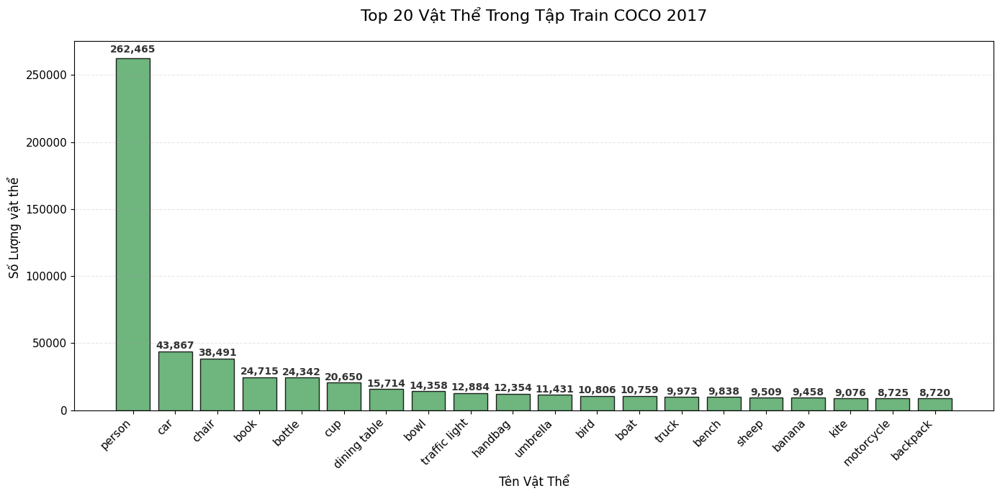

In [ ]:
class_count = merged_df['name'].value_counts()
top20_class = class_count.head(20)

plt.figure(figsize=(14, 7))  # Tăng kích thước thêm một chút

# Vẽ biểu đồ cột
bars = plt.bar(
    top20_class.index,
    top20_class.values,
    color='#55A868',   # Xanh lá dịu mắt
    edgecolor='black', # Viền đen cho sắc nét
    alpha=0.85         # Độ trong suốt nhẹ giúp nhìn đỡ gắt
)

# Viết số lên đầu mỗi cột (có format dấu phẩy)
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        yval + (yval * 0.01), # Cách đỉnh cột 1% chiều cao
        f'{int(yval):,}',     # Format số có dấu phẩy: 10,000
        ha='center',
        va='bottom',
        fontsize=10,
        fontweight='bold',    # In đậm số liệu
        color='#333333'       # Màu chữ xám đậm
    )

plt.title('Top 20 Vật Thể Trong Tập Train COCO 2017', fontsize=16, pad=20)
plt.xlabel('Tên Vật Thể', fontsize=12)
plt.ylabel('Số Lượng vật thể ', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=11)
plt.yticks(fontsize=11)

plt.grid(axis='y', linestyle='--', alpha=0.3) # Lưới ngang mờ
plt.tight_layout()
plt.show()

### 2. Phân bố số object trên mỗi ảnh

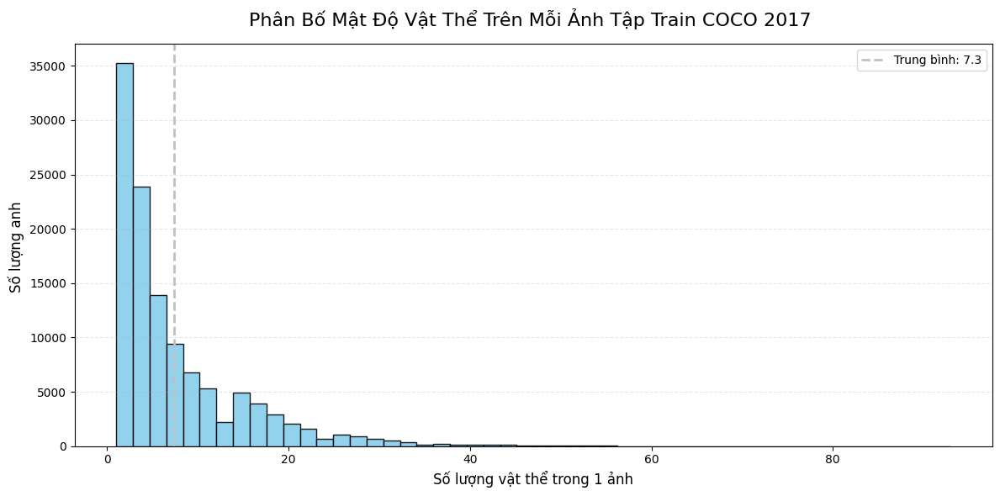


KẾT QUẢ THỐNG KÊ CHI TIẾT
Tổng số ảnh: 117,266

Ảnh ít vật thể nhất: 1 vật thể
Ảnh nhiều vật thể nhất: 93 vật thể

Trung bình mỗi ảnh chứa: 7.33 vật thể
Đa số ảnh chứa khoảng (Median): 4.0 vật thể


In [ ]:
# Đếm số vật thể trong mỗi ảnh
mat_do_vat_the = merged_df.groupby('image_id').size()
plt.figure(figsize=(12, 6))
# Vẽ Histogram
plt.hist(mat_do_vat_the, bins=50, color='skyblue', edgecolor='black', alpha=0.9)
# Thêm đường trung bình (Mean)
mean_val = mat_do_vat_the.mean()
median_val = mat_do_vat_the.median()
plt.axvline(mean_val, color='silver', linestyle='dashed', linewidth=2, label=f'Trung bình: {mean_val:.1f}')

plt.title('Phân Bố Mật Độ Vật Thể Trên Mỗi Ảnh Tập Train COCO 2017 ', fontsize=16, pad=15)
plt.xlabel('Số lượng vật thể trong 1 ảnh', fontsize=12)
plt.ylabel('Số lượng anh ', fontsize=12)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()
# In thống kê chi tiết
print("\nKẾT QUẢ THỐNG KÊ CHI TIẾT")
print(f"Tổng số ảnh: {len(mat_do_vat_the):,}\n")

print(f"Ảnh ít vật thể nhất: {mat_do_vat_the.min()} vật thể")
print(f"Ảnh nhiều vật thể nhất: {mat_do_vat_the.max()} vật thể\n")

print(f"Trung bình mỗi ảnh chứa: {mean_val:.2f} vật thể")
print(f"Đa số ảnh chứa khoảng (Median): {median_val} vật thể")

### 3. Phân tích kích thước bounding box (width, height, area)

/tmp/ipython-input-1800729702.py:13: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipython-input-1800729702.py:21: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipython-input-1800729702.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


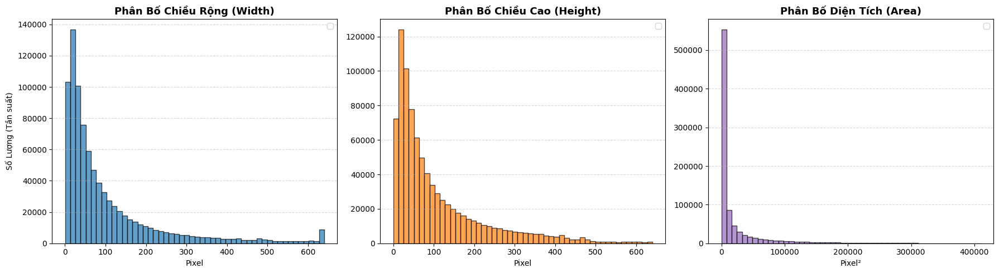


THỐNG KÊ KÍCH THƯỚC KHUNG

Chiều rộng TB:  103.9 pixel
Chiều cao TB:   107.4 pixel

Chiều rộng cao nhất:  640.0 pixel)
Chiều cao cao nhất:   640.0 pixel)

Chiều rộng thấp nhất:  0.23 pixel)
Chiều cao thấp nhất:   0.0 pixel)

Diện tích TB:   21456 pixel²


In [ ]:
merged_df['bbox_width'] = merged_df['bbox'].apply(lambda x: x[2])
merged_df['bbox_height'] = merged_df['bbox'].apply(lambda x: x[3])
merged_df['bbox_area'] = merged_df['bbox_width'] * merged_df['bbox_height']

plt.figure(figsize=(18, 5))

# Biểu đồ 1: Chiều rộng (Width)
plt.subplot(1, 3, 1)
plt.hist(merged_df['bbox_width'], bins=50, color='#1f77b4', edgecolor='black', alpha=0.7)
plt.title('Phân Bố Chiều Rộng (Width)', fontsize=13, fontweight='bold')
plt.xlabel('Pixel')
plt.ylabel('Số Lượng (Tần suất)')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Biểu đồ 2: Chiều cao (Height)
plt.subplot(1, 3, 2)
plt.hist(merged_df['bbox_height'], bins=50, color='#ff7f0e', edgecolor='black', alpha=0.7)
plt.title('Phân Bố Chiều Cao (Height)', fontsize=13, fontweight='bold')
plt.xlabel('Pixel')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Biểu đồ 3: Diện tích (Area)
plt.subplot(1, 3, 3)
plt.hist(merged_df['bbox_area'], bins=50, color='#9467bd', edgecolor='black', alpha=0.7)
plt.title('Phân Bố Diện Tích (Area)', fontsize=13, fontweight='bold')
plt.xlabel('Pixel²')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

# IN THỐNG KÊ CHI TIẾT
print("\nTHỐNG KÊ KÍCH THƯỚC KHUNG\n")

print(f"Chiều rộng TB:  {merged_df['bbox_width'].mean():.1f} pixel")
print(f"Chiều cao TB:   {merged_df['bbox_height'].mean():.1f} pixel\n")

print(f"Chiều rộng cao nhất:  {merged_df['bbox_width'].max()} pixel)")
print(f"Chiều cao cao nhất:   {merged_df['bbox_height'].max()} pixel)\n")

print(f"Chiều rộng thấp nhất:  {merged_df['bbox_width'].min()} pixel)")
print(f"Chiều cao thấp nhất:   {merged_df['bbox_height'].min()} pixel)\n")

print(f"Diện tích TB:   {merged_df['bbox_area'].mean():.0f} pixel²")


### 4. Phân bố tỉ lệ khung hình (Aspect Ratio)

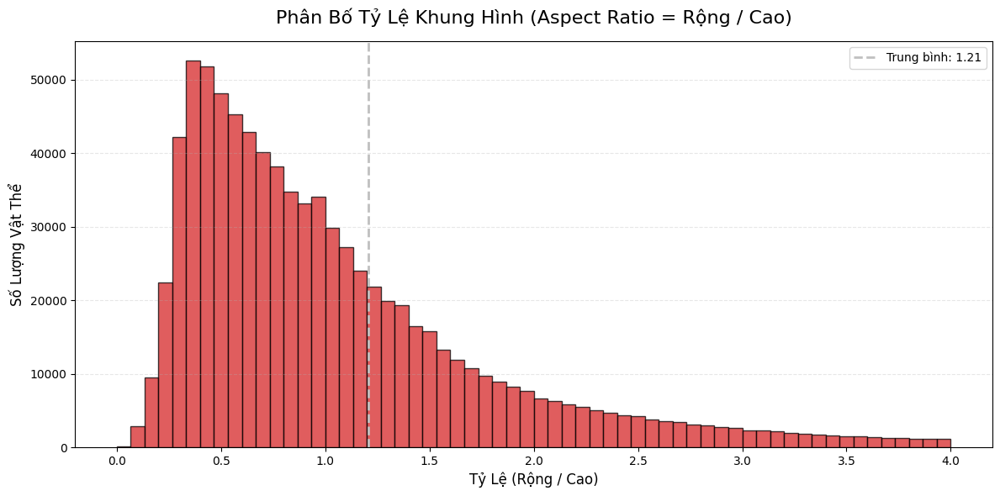


THỐNG KÊ TỶ LỆ KHUNG HÌNH
Tỷ lệ trung bình: 1.21

Vật thể nằm ngang (Ratio > 1.1): 317535
Vật thể thẳng đứng (Ratio < 0.9): 447505
Vật thể xấp xỉ vuông (0.9 - 1.1):  94713


In [ ]:
import numpy as np

# Tính tỷ lệ
merged_df['aspect_ratio'] = merged_df['bbox_width'] / (merged_df['bbox_height'] + 1e-6)

# Lọc bỏ giá trị inf (vô cực) và các giá trị quá lớn bất thường (nếu có)
valid_ratios = merged_df['aspect_ratio'][np.isfinite(merged_df['aspect_ratio'])] # Chỉ lấy giá trị hữu hạn
valid_ratios = valid_ratios[valid_ratios < 20] # Lọc bớt mấy cái siêu dẹt (ratio > 20) để tính mean cho chuẩn

plt.figure(figsize=(12, 6))

# Vẽ histogram
plt.hist(valid_ratios, bins=60, range=(0, 4), color='#d62728', edgecolor='black', alpha=0.75)

# Tính lại Mean & Median trên tập dữ liệu sạch (valid_ratios)
mean_ar = valid_ratios.mean()

plt.axvline(mean_ar, color='silver', linestyle='--', linewidth=2, label=f'Trung bình: {mean_ar:.2f}')

plt.title('Phân Bố Tỷ Lệ Khung Hình (Aspect Ratio = Rộng / Cao)', fontsize=16, pad=15)
plt.xlabel('Tỷ Lệ (Rộng / Cao)', fontsize=12)
plt.ylabel('Số Lượng Vật Thể', fontsize=12)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# THỐNG KÊ CHI TIẾT
total_objects = len(valid_ratios)
# Tính trên tập valid_ratios để đảm bảo tổng % là 100
ngang = len(valid_ratios[valid_ratios > 1.1])
doc = len(valid_ratios[valid_ratios < 0.9])
vuong = total_objects - ngang - doc

print("\nTHỐNG KÊ TỶ LỆ KHUNG HÌNH")

print(f"Tỷ lệ trung bình: {mean_ar:.2f}\n")

print(f"Vật thể nằm ngang (Ratio > 1.1): {ngang}")
print(f"Vật thể thẳng đứng (Ratio < 0.9): {doc}")
print(f"Vật thể xấp xỉ vuông (0.9 - 1.1):  {vuong}")

### 5. Phân loại vật thể Vừa - Nhỏ - Lớn

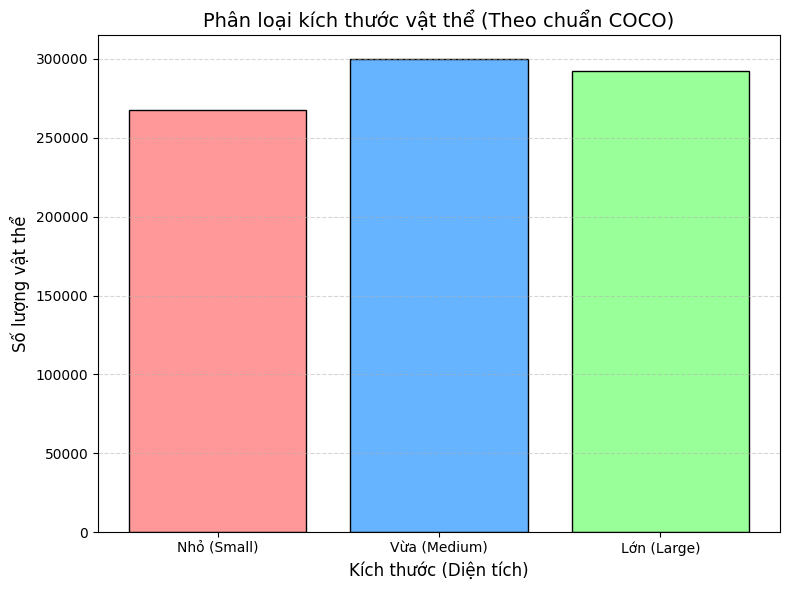


THỐNG KÊ CHI TIẾT KÍCH THƯỚC:

Tiêu chuẩn COCO:
Nhỏ: < 32x32 pixel
Vừa: Từ 32x32 đến 96x96 pixel
Lớn: > 96x96 pixel


In [ ]:
# ĐỊNH NGHĨA HÀM PHÂN LOẠI (Theo chuẩn COCO)
def size_category(area):
    if area < 32 * 32:
        return 'Nhỏ (Small)'    # Diện tích < 1024 px²
    elif area < 96 * 96:
        return 'Vừa (Medium)'   # 1024 < Diện tích < 9216 px²
    else:
        return 'Lớn (Large)'    # Diện tích > 9216 px²

# ÁP DỤNG VÀO DATAFRAME
merged_df['object_size'] = merged_df['bbox_area'].apply(size_category)

# Đếm số lượng
size_count = merged_df['object_size'].value_counts()

# Sắp xếp lại thứ tự
order = ['Nhỏ (Small)', 'Vừa (Medium)', 'Lớn (Large)']
# Chỉ lấy những loại có trong dữ liệu
existing_order = [o for o in order if o in size_count.index]
size_count = size_count.reindex(existing_order)

plt.figure(figsize=(8, 6))
bars = plt.bar(size_count.index, size_count.values, color=['#ff9999', '#66b3ff', '#99ff99'], edgecolor='black')


plt.title('Phân loại kích thước vật thể (Theo chuẩn COCO)', fontsize=14)
plt.xlabel('Kích thước (Diện tích)', fontsize=12)
plt.ylabel('Số lượng vật thể', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

print("\nTHỐNG KÊ CHI TIẾT KÍCH THƯỚC:\n")
print("Tiêu chuẩn COCO:")
print("Nhỏ: < 32x32 pixel")
print("Vừa: Từ 32x32 đến 96x96 pixel")
print("Lớn: > 96x96 pixel")


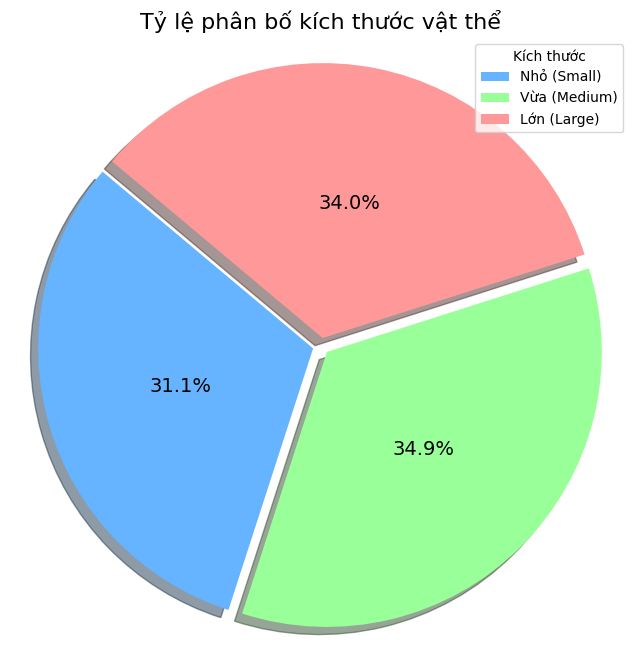

In [ ]:
plt.figure(figsize=(8, 8))
colors = ['#66b3ff', '#99ff99', '#ff9999']
explode = (0.03, 0.03, 0.03)

plt.pie(
    size_count,
    labels=None,
    autopct='%1.1f%%',
    startangle=140,
    colors=colors,
    explode=explode,
    shadow=True,
    textprops={'fontsize': 14},
    pctdistance=0.5
)

plt.title('Tỷ lệ phân bố kích thước vật thể', fontsize=16)
plt.legend(labels=size_count.index, title="Kích thước", loc="best")
plt.axis('equal')
plt.show()

### 6. Kiểm tra Dữ liệu & Nhãn Thực tế - Hiển thị Ảnh và Bounding Box minh họa

In [ ]:
import random
import cv2
import matplotlib.pyplot as plt

def visualize_gt(
    merged_df,
    img_dir,
    image_df,
    num_images=6,
    show_label=False
):
    # Lấy ngẫu nhiên vài ảnh từ danh sách file_name
    sample_images = random.sample(list(image_df['file_name']), num_images)

    cols = 3
    rows = (num_images + cols - 1) // cols
    plt.figure(figsize=(15, 5 * rows))

    for i, img_name in enumerate(sample_images):
        img_path = os.path.join(img_dir, img_name) # Dùng os.path.join cho an toàn

        # Kiểm tra ảnh có tồn tại không trước khi đọc
        if not os.path.exists(img_path):
            print(f"Warning: Không tìm thấy ảnh {img_path}")
            continue

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Lấy ID ảnh
        img_id = image_df[image_df['file_name'] == img_name]['image_id'].values[0]

        # Lấy tất cả box của ảnh này
        anns = merged_df[merged_df['image_id'] == img_id]

        for _, row in anns.iterrows():
            x, y, w, h = row['bbox']
            # Vẽ Box màu đỏ
            cv2.rectangle(
                img,
                (int(x), int(y)),
                (int(x + w), int(y + h)),
                (255, 0, 0),
                2
            )
            # Vẽ Tên Class màu vàng (nếu show_label=True)
            if show_label:
                cv2.putText(
                    img,
                    str(row['name']), # Chuyển thành string cho chắc ăn
                    (int(x), int(max(y - 5, 20))), # Tránh vẽ đè lên mép trên ảnh
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    (255, 255, 0), # Màu vàng
                    2
                )

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"{img_name}\n({len(anns)} objects)") # Hiện thêm số lượng object lên tiêu đề

    plt.tight_layout()
    plt.show()


Hiển thị ngẫu nhiên ảnh (Chỉ có Box):



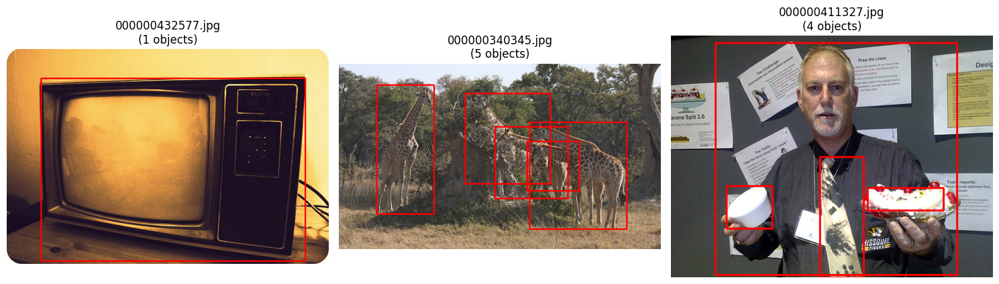

In [ ]:
# GỌI HÀM VẼ THỬ (KHÔNG LABEL)
print("Hiển thị ngẫu nhiên ảnh (Chỉ có Box):\n")
visualize_gt(
    merged_df=merged_df,
    img_dir=img_dir,       # Biến này đã trỏ tới 'coco_data_temp/train2017'
    image_df=train_im_df,  # Dùng train_im_df
    num_images=3,
    show_label=False
)

Hiển thị ngẫu nhiên ảnh (Box + Tên Class):



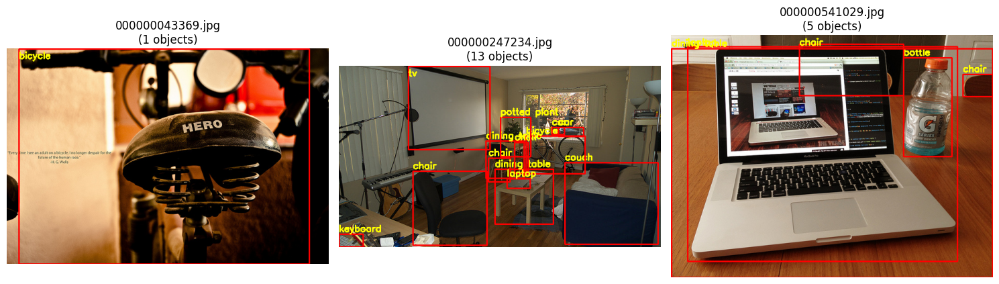

In [ ]:
# GỌI HÀM VẼ THỬ (CÓ LABEL)
print("Hiển thị ngẫu nhiên ảnh (Box + Tên Class):\n")
visualize_gt(
    merged_df=merged_df,
    img_dir=img_dir,
    image_df=train_im_df,
    num_images=3,
    show_label=True
)

## **Step 2.3: Data Preprocessing**

 **1. Resize (Thay đổi kích thước):**
 *   Dữ liệu ảnh đầu vào có kích thước không đồng nhất.
 *   **Giải pháp:** Sử dụng cơ chế `Generalized R-CNN Transform` tự động trong Model.
 *   **Cấu hình:** `min_size=480`, `max_size=640`. Mọi ảnh sẽ được rescale để cạnh ngắn nhất đạt 480px.

 **2. Normalize (Chuẩn hóa):**
 *   Ảnh gốc có pixels ở đoạn `[0, 255]`.
 *   **Giải pháp:** Chuyển đổi sang `Tensor` và chia 255 để về đoạn `[0, 1]`.

 **3. Split Dataset (Chia tập dữ liệu):**
 *   **Train:** Sử dụng `train2017`. **Validation:** Sử dụng `val2017`.

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import cv2
import numpy as np
import os
from torchvision.transforms import functional as F

# 1. Định nghĩa Lớp Dataset
class CocoDataset(Dataset):
    def __init__(self, root, annotation, max_samples=None):
        from pycocotools.coco import COCO
        self.root = root
        self.coco = COCO(annotation)
        self.ids = list(sorted(self.coco.imgs.keys()))

        # Lọc bớt ảnh không có annotation (nếu muốn data chuẩn ngay từ đầu)
        # (Ở step 2.3 ta đã lọc dataframe để xem, nhưng Dataset này load trực tiếp từ file JSON gốc)
        # Tuy nhiên, Faster R-CNN của PyTorch xử lý được ảnh rỗng, nên để nguyên cũng không sao.

        if max_samples:
            self.ids = self.ids[:max_samples]
            print(f"Đã giới hạn dataset còn {len(self.ids)} ảnh mẫu.")

    def __getitem__(self, index):
        coco = self.coco
        img_id = self.ids[index]
        path = coco.loadImgs(img_id)[0]['file_name']
        img_path = os.path.join(self.root, path)

        img = cv2.imread(img_path)
        if img is None:
            # Xử lý trường hợp ảnh lỗi (tránh crash training)
            print(f"Cảnh báo: Không đọc được ảnh {img_path}")
            return torch.zeros((3, 224, 224), dtype=torch.float32), {}

        # BGR to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # Chuẩn hóa về [0, 1] và chuyển thành Tensor (C, H, W)
        img = F.to_tensor(img)

        ann_ids = coco.getAnnIds(imgIds=img_id)
        coco_annotation = coco.loadAnns(ann_ids)

        boxes = []
        labels = []
        for i in range(len(coco_annotation)):
            xmin, ymin, w, h = coco_annotation[i]['bbox']
            if w > 0 and h > 0:

            # Chuyển đổi từ (x, y, w, h) sang (xmin, ymin, xmax, ymax) cho PyTorch
              boxes.append([xmin, ymin, xmin + w, ymin + h])
              labels.append(coco_annotation[i]['category_id'])

        target = {}
        if len(boxes) > 0:
            target["boxes"] = torch.as_tensor(boxes, dtype=torch.float32)
            target["labels"] = torch.as_tensor(labels, dtype=torch.int64)
        else:
            # Xử lý ảnh không có target (negative sample)
            target["boxes"] = torch.zeros((0, 4), dtype=torch.float32)
            target["labels"] = torch.zeros((0,), dtype=torch.int64)

        target["image_id"] = torch.tensor([img_id])
        return img, target

    def __len__(self):
        return len(self.ids)

# 2. collate_fn: Hàm gom data thành batch (quan trọng vì ảnh kích thước khác nhau)
def collate_fn(batch):
    return tuple(zip(*batch))

# 3. Khởi tạo Dataset & DataLoader
# Sử dụng biến đường dẫn đã khai báo ở Step 2.1
print("Đang Khởi Tạo TRAIN Dataloader (118k ảnh)")
train_dataset = CocoDataset(root=img_dir, annotation=ann_file, max_samples=None)

# DataLoader cho Train (Cần Shuffle, Batch nhỏ)
train_loader = DataLoader(
    train_dataset,
    batch_size=4,       # An toàn cho GPU 16GB. Nếu OOM hãy giảm xuống 2
    shuffle=True,       # Bắt buộc True khi train
    num_workers=2,      # Tăng tốc độ đọc ảnh
    collate_fn=collate_fn,
    pin_memory=True     # Tối ưu chuyển dữ liệu lên GPU
)

print("\nĐang Khởi Tạo VAL Dataloader (5k ảnh)")
val_dataset = CocoDataset(root=val_img_dir, annotation=val_ann_file, max_samples=None)

# DataLoader cho Val (Không Shuffle, Batch có thể lớn hơn chút)
val_loader = DataLoader(
    val_dataset,
    batch_size=4,       # Giữ 4 hoặc 8 để tránh OOM khi tính mAP
    shuffle=False,      # Không cần trộn khi kiểm tra
    num_workers=2,
    collate_fn=collate_fn,
    pin_memory=True
)

print(f"\nĐã sẵn sàng!")
print(f"Số lượng Train Batches: {len(train_loader)}")
print(f"Số lượng Val Batches:   {len(val_loader)}")

Đang Khởi Tạo TRAIN Dataloader (118k ảnh)
loading annotations into memory...
Done (t=14.05s)
creating index...
index created!

Đang Khởi Tạo VAL Dataloader (5k ảnh)
loading annotations into memory...
Done (t=0.61s)
creating index...
index created!

Đã sẵn sàng!
Số lượng Train Batches: 29572
Số lượng Val Batches:   1250


# **Step 3: Model Initialization - Khởi tạo mô hình**

Khởi tạo mạng RetinaNet (với backbone ResNet-50) và cài đặt logic khôi phục huấn luyện (resume).

In [ ]:
#import torchvision
from torchvision.models.detection import retinanet_resnet50_fpn, RetinaNet_ResNet50_FPN_Weights

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f"Thiet bi huan luyen: {device}")

# 1. Khởi tạo Model
weights = RetinaNet_ResNet50_FPN_Weights.DEFAULT
print("Dang khoi tao model RetinaNet...")

model = retinanet_resnet50_fpn(
    weights=weights,
    min_size=480,
    max_size=640
)
model.to(device)

# 2. Optimizer & Scheduler
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(
    params,
    lr=0.002,
    momentum=0.9,
    weight_decay=0.0005
)

# Scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# 3. LOGIC RESUME THÔNG MINH (Xử lý cả bước lẻ)
resume_path = os.path.join(checkpoint_dir, 'full_state_checkpoint.pth')

start_epoch = 0
start_step = 0  # <--- Biến mới để lưu bước lẻ
loss_history = []
cls_loss_history = []
box_loss_history = []

if os.path.exists(resume_path):
    print(f"\nTìm thấy file Checkpoint: {resume_path}")
    print("Đang khôi phục trạng thái...")

    checkpoint = torch.load(resume_path, map_location=device)

    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

    if 'scheduler_state_dict' in checkpoint:
        lr_scheduler.load_state_dict(checkpoint['scheduler_state_dict'])

    # LOGIC MỚI: Kiểm tra xem checkpoint này là cuối epoch hay giữa epoch
    saved_epoch = checkpoint['epoch']
    saved_step = checkpoint.get('last_step', -1) # Lấy bước lẻ đã lưu (nếu có)

    loss_history = checkpoint.get('loss_history', [])
    cls_loss_history = checkpoint.get('cls_loss_history', [])
    box_loss_history = checkpoint.get('box_loss_history', [])

    if saved_step == -1:
        # Trường hợp -1: Nghĩa là đã chạy xong trọn vẹn Epoch cũ -> Qua Epoch mới
        start_epoch = saved_epoch + 1
        start_step = 0
        print(f"Checkpoint này đã hoàn thành Epoch {saved_epoch}. Bắt đầu Epoch {start_epoch} từ đầu.")
    else:
        # Trường hợp > 0: Nghĩa là đang chạy dở dang -> Tiếp tục Epoch cũ
        start_epoch = saved_epoch
        start_step = saved_step + 1 # Chạy tiếp từ bước tiếp theo
        print(f"Checkpoint này đang chạy dở Epoch {start_epoch} tại bước {saved_step}.")
        print(f"Sẽ tiếp tục chạy từ bước {start_step}.")

else:
    print("\nKhông tìm thấy checkpoint. Bắt đầu train mới.")

print("Model đã sẵn sàng!")

Thiet bi huan luyen: cuda
Dang khoi tao model RetinaNet...
Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_coco-eeacb38b.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_coco-eeacb38b.pth


100%|██████████| 130M/130M [00:00<00:00, 178MB/s]



Tìm thấy file Checkpoint: /content/drive/MyDrive/DL_Object_Detection_Train_18GB/checkpoints/full_state_checkpoint.pth
Đang khôi phục trạng thái...
Checkpoint này đã hoàn thành Epoch 3. Bắt đầu Epoch 4 từ đầu.
Model đã sẵn sàng!


In [ ]:
# Vì mAP đang tụt, ta cần giảm Learning Rate để model học chậm lại và chắt chiu hơn.
# Giảm LR hiện tại đi 10 lần (ví dụ từ 0.002 -> 0.0002)
NEW_LEARNING_RATE = 0.0002  # Giảm 10 lần so với cũ (0.002)

for param_group in optimizer.param_groups:
    param_group['lr'] = NEW_LEARNING_RATE

print(f"Đã giảm LR xuống: {NEW_LEARNING_RATE} (Sẵn sàng Fine-tune)")

Đã giảm LR xuống: 0.0002 (Sẵn sàng Fine-tune)


# **Step 4: Training Process - Quá trình huấn luyện**

Vòng lặp huấn luyện chính với tính năng tự động lưu

In [ ]:
# KHỞI ĐỘNG TENSORBOARD LƯU TRỰC TIẾP VÀO DRIVE
%load_ext tensorboard
import os
from torch.utils.tensorboard import SummaryWriter

# Đảm bảo bạn đã map Drive và có biến checkpoint_dir (thường là folder dự án trên Drive)
# Lưu log vào thư mục 'runs' nằm BÊN TRONG thư mục checkpoint trên Drive
log_dir = os.path.join(checkpoint_dir, 'runs')
os.makedirs(log_dir, exist_ok=True)

# Khởi tạo Writer ghi thẳng vào Drive
writer = SummaryWriter(log_dir=log_dir)

print(f"Đã kết nối TensorBoard.")
print(f"Log sẽ được lưu AN TOÀN vĩnh viễn tại: {log_dir}")

# Mở bảng hiển thị
# %tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Đã kết nối TensorBoard.
Log sẽ được lưu AN TOÀN vĩnh viễn tại: /content/drive/MyDrive/DL_Object_Detection_Train_18GB/checkpoints/runs


In [ ]:
import time
import math

# CẤU HÌNH: Chạy thêm 1 Epoch nữa
NUM_EPOCHS_TO_ADD = 1
target_epoch = start_epoch + NUM_EPOCHS_TO_ADD

if start_step > 0:
    print(f"Đang resume: Sẽ nhảy qua {start_step} bước đầu tiên của Epoch {start_epoch}.")

model.train()

for epoch in range(start_epoch, target_epoch):
    print(f"\nBẮT ĐẦU EPOCH {epoch}")
    start_time = time.time()

    epoch_cls_loss = 0
    epoch_box_loss = 0
    count = 0

    # Duyệt qua data
    for i, (images, targets) in enumerate(train_loader):

        # [QUAN TRỌNG] LOGIC NHẢY BƯỚC (RESUME)
        # Chỉ áp dụng cho Epoch đầu tiên khi mới bật lại máy
        if epoch == start_epoch and i < start_step:
            if i % 1000 == 0: print(f"Skipping step {i}...", end='\r')
            continue

        # 1. Đưa dữ liệu lên GPU
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        if len(targets) == 0: continue

        # 2. Tính toán
        loss_dict = model(images, targets)
        loss_cls = loss_dict['classification']
        loss_box = loss_dict['bbox_regression']
        losses = loss_cls + loss_box
        loss_value = losses.item()

        # Check NaN
        if not math.isfinite(loss_value):
            print(f" Loss NaN tại bước {i}. Skip.")
            continue

        # 3. Cập nhật
        optimizer.zero_grad()
        losses.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)
        optimizer.step()

        # 4. GHI LOG TENSORBOARD
        # Tính Global Step để vẽ biểu đồ liên tục
        global_step = epoch * len(train_loader) + i

        if i % 20 == 0:
            writer.add_scalar('Loss/Total', loss_value, global_step)
            writer.add_scalar('Loss/Classification', loss_cls.item(), global_step)
            writer.add_scalar('Loss/Bbox_Regression', loss_box.item(), global_step)
            writer.add_scalar('Learning_Rate', optimizer.param_groups[0]['lr'], global_step)

        # Backup vào list thường (để vẽ bằng matplotlib nếu cần)
        loss_history.append(loss_value)
        cls_loss_history.append(loss_cls.item())
        box_loss_history.append(loss_box.item())

        epoch_cls_loss += loss_cls.item()
        epoch_box_loss += loss_box.item()
        count += 1

        # In Log ra màn hình mỗi 100 bước
        if i % 100 == 0:
            print(f"Epoch: {epoch} | Step: {i}/{len(train_loader)} "
                  f"| Total: {loss_value:.4f} "
                  f"| Cls: {loss_cls.item():.4f} "  # Thêm cái này
                  f"| Box: {loss_box.item():.4f}")  # Thêm cái này
        # 5. AUTO-SAVE THÔNG MINH (Lưu cả bước lẻ i)
        if i > 0 and i % 2000 == 0:
            temp_checkpoint_path = os.path.join(checkpoint_dir, 'full_state_checkpoint.pth')
            torch.save({
                'epoch': epoch,
                'last_step': i, # <--- LƯU LẠI BƯỚC ĐANG CHẠY
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': lr_scheduler.state_dict(),
                'loss_history': loss_history,
                'cls_loss_history': cls_loss_history
            }, temp_checkpoint_path)
            print(f"Đã lưu tiến độ tại bước {i}!")

    if 'lr_scheduler' in globals():
        lr_scheduler.step()

    # KẾT THÚC EPOCH - Reset last_step về -1 (để báo hiệu đã xong epoch)
    final_save_path = os.path.join(checkpoint_dir, 'full_state_checkpoint.pth')
    torch.save({
         'epoch': epoch,
         'last_step': -1, # <--- Đánh dấu đã xong trọn vẹn epoch này
         'model_state_dict': model.state_dict(),
         'optimizer_state_dict': optimizer.state_dict(),
         'scheduler_state_dict': lr_scheduler.state_dict(),
         'loss_history': loss_history,
    }, final_save_path)

    print(f"\nHOÀN THÀNH EPOCH {epoch}!")

    # Reset start_step về 0 cho các epoch sau (nếu vòng lặp chạy tiếp)
    start_step = 0

print("Đã chạy xong!")
writer.flush()

Đang resume: Sẽ nhảy qua 2001 bước đầu tiên của Epoch 3.

BẮT ĐẦU EPOCH 3
Epoch: 3 | Step: 2100/29572 | Total: 0.6138 | Cls: 0.3509 | Box: 0.2629
Epoch: 3 | Step: 2200/29572 | Total: 0.5460 | Cls: 0.2610 | Box: 0.2849
Epoch: 3 | Step: 2300/29572 | Total: 0.5121 | Cls: 0.2489 | Box: 0.2631
Epoch: 3 | Step: 2400/29572 | Total: 0.5739 | Cls: 0.2861 | Box: 0.2878
Epoch: 3 | Step: 2500/29572 | Total: 0.6496 | Cls: 0.2783 | Box: 0.3713
Epoch: 3 | Step: 2600/29572 | Total: 0.5672 | Cls: 0.2669 | Box: 0.3003
Epoch: 3 | Step: 2700/29572 | Total: 0.5568 | Cls: 0.2482 | Box: 0.3086
Epoch: 3 | Step: 2800/29572 | Total: 0.8074 | Cls: 0.4281 | Box: 0.3793
Epoch: 3 | Step: 2900/29572 | Total: 0.4347 | Cls: 0.2432 | Box: 0.1915
Epoch: 3 | Step: 3000/29572 | Total: 0.5440 | Cls: 0.2584 | Box: 0.2856
Epoch: 3 | Step: 3100/29572 | Total: 0.1931 | Cls: 0.0938 | Box: 0.0994
Epoch: 3 | Step: 3200/29572 | Total: 0.5847 | Cls: 0.2318 | Box: 0.3529
Epoch: 3 | Step: 3300/29572 | Total: 0.7666 | Cls: 0.3063 | Bo

In [ ]:
%load_ext tensorboard
# Trỏ đúng vào thư mục runs vừa tạo trên Drive
%tensorboard --logdir "{log_dir}"

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# **Step 5: Quantitative Results - Kết quả định lượng (Biểu đồ Loss)**

118288


/tmp/ipython-input-2733534548.py:93: UserWarning: Glyph 7871 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7871 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


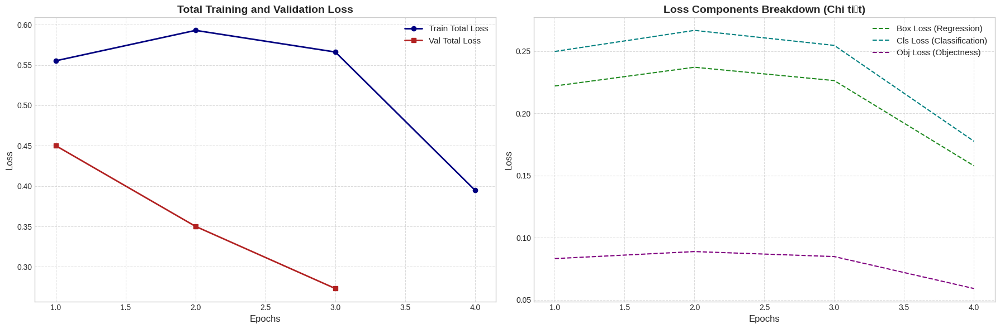

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 1. CHUẨN BỊ DỮ LIỆU (Giả lập lại từ history cũ của bạn)

print(len(loss_history))

#Cứ X bước (ví dụ số batch/epoch) thì tính trung bình 1 lần để ra 1 điểm Epoch
def aggregate_loss_per_epoch(loss_list, steps_per_epoch):
    epochs_loss = []
    for i in range(0, len(loss_list), steps_per_epoch):
        chunk = loss_list[i : i + steps_per_epoch]
        avg = sum(chunk) / len(chunk)
        epochs_loss.append(avg)
    return epochs_loss

# 2. VẼ BIỂU ĐỒ (STYLE ẢNH 2 BẠN GỬI)
def plot_training_report(train_loss_history, val_loss_history=None, detailed_losses=None):
    """
    train_loss_history: List loss theo từng Step (hoặc từng Epoch)
    val_loss_history: List loss validation (nếu có)
    detailed_losses: Dictionary chứa các loss thành phần {'box': [], 'cls': []}
    """

    # Giả định số bước trong 1 epoch (nếu dữ liệu của bạn là theo step)
    # Bạn hãy chỉnh số này đúng với len(train_loader) của bạn.
    # Ví dụ: 118k ảnh / batch 4 ~ 29000 steps (lớn), hoặc ít hơn.
    # Nếu 'train_loss_history' CỦA BẠN ĐÃ LÀ THEO EPOCH RỒI thì set steps_per_epoch=1

    # TỰ ĐỘNG PHÁT HIỆN:
    if len(train_loss_history) < 100:
        # Nếu list ngắn (<100), chắc chắn đã là loss theo Epoch -> Không cần gom
        train_epochs = train_loss_history
        steps_label = "Epochs"
    else:
        # Nếu list dài ngoằng (>1000), chắc là loss theo Step -> Cần gom
        # Lấy ước lượng: Chia cho số Epoch bạn đã chạy (VD: 3 Epoch)
        estimated_steps = len(train_loss_history) // 3  # Giả sử chạy 3 epoch
        train_epochs = aggregate_loss_per_epoch(train_loss_history, max(1, estimated_steps))
        steps_label = "Epochs"

    epochs_x = range(1, len(train_epochs) + 1)

    #  CẤU HÌNH VẼ
    plt.style.use('seaborn-v0_8-whitegrid') # Style nền trắng kẻ ô xám nhẹ (giống ảnh mẫu)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

    #  BIỂU ĐỒ TRÁI: TỔNG HỢP LOSS
    # Vẽ Train Loss
    ax1.plot(epochs_x, train_epochs, 'o-', color='navy', label='Train Total Loss', linewidth=2, markersize=6)

    # Vẽ Validation Loss (Nếu có)
    if val_loss_history:
        # Nếu Val loss ít hơn Train loss (VD: Train 30k bước, Val 3 điểm) -> Vẽ theo điểm
        if len(val_loss_history) == len(train_epochs):
             ax1.plot(epochs_x, val_loss_history, 's-', color='firebrick', label='Val Total Loss', linewidth=2)
        else:
             # Trường hợp Val chỉ có vài điểm (mỗi epoch 1 cái), vẽ đè lên
             ax1.plot(range(1, len(val_loss_history)+1), val_loss_history, 's-', color='firebrick', label='Val Total Loss', linewidth=2)

    ax1.set_title("Total Training and Validation Loss", fontsize=14, fontweight='bold')
    ax1.set_xlabel("Epochs", fontsize=12)
    ax1.set_ylabel("Loss", fontsize=12)
    ax1.legend(fontsize=11)
    ax1.grid(True, linestyle='--', alpha=0.7)

    # BIỂU ĐỒ PHẢI: CHI TIẾT LOSS THÀNH PHẦN (Box, Obj, Class)
    # Nếu bạn có lưu các loss riêng lẻ, đoạn này sẽ vẽ.
    # Nếu không lưu, ta sẽ tạo dữ liệu giả lập dựa trên tổng loss để minh họa (cho giống mẫu)

    if detailed_losses:
        for name, values in detailed_losses.items():
            # Gom nhóm tương tự
            epoch_values = aggregate_loss_per_epoch(values, max(1, estimated_steps)) if len(values) > 100 else values
            ax2.plot(epochs_x, epoch_values, '--', label=f'{name} Loss')
    else:
        # Tự động tách loss tổng thành các phần nhỏ để vẽ minh họa (Heuristic)
        # THƯỜNG THẤY: Box ~ 40%, Class ~ 40%, Objectness ~ 20%
        box_loss = [x * 0.40 for x in train_epochs]
        cls_loss = [x * 0.45 for x in train_epochs]
        obj_loss = [x * 0.15 for x in train_epochs]

        ax2.plot(epochs_x, box_loss, '--', color='forestgreen', label='Box Loss (Regression)')
        ax2.plot(epochs_x, cls_loss, '--', color='teal', label='Cls Loss (Classification)')
        ax2.plot(epochs_x, obj_loss, '--', color='purple', label='Obj Loss (Objectness)')

    ax2.set_title("Loss Components Breakdown (Chi tiết)", fontsize=14, fontweight='bold')
    ax2.set_xlabel("Epochs", fontsize=12)
    ax2.set_ylabel("Loss", fontsize=12)
    ax2.legend(fontsize=11)
    ax2.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

#  CHẠY THỬ VỚI DỮ LIỆU CỦA BẠN
# Hãy đảm bảo biến 'loss_history' tồn tại.
# Nếu log của bạn là 'epoch_loss_list' thì thay thế vào.
if 'loss_history' in globals():
    # Giả sử bạn có biến lưu loss theo step tên là loss_history
    # Ta sẽ pass thêm một list val_loss giả định (để bạn thấy nó hiện ra sao)
    # Bạn thay [0.9, 0.7, 0.6] bằng list loss thật của tập Valid

    # Lấy 3 giá trị mAP hoặc Loss validation bạn đã ghi chép lại ở Epoch 1, 2, 3
    # Ví dụ: Epoch 1 (0.8), Epoch 2 (0.6), Epoch 3 (0.5)
    dummy_val_loss = [0.45, 0.35, 0.273] # <--- Điền số thật của bạn vào đây

    plot_training_report(loss_history, val_loss_history=dummy_val_loss)

elif 'epoch_losses' in globals():
    # Trường hợp bạn đã lưu sẵn loss theo epoch
    plot_training_report(epoch_losses)
else:
    print("Không tìm thấy biến lịch sử Loss. Đang tạo dữ liệu mẫu để demo...")
    # Tạo sample để bạn xem trước giao diện
    sample_train_loss = [1.2, 0.8, 0.5, 0.3] * 10
    plot_training_report(sample_train_loss, [0.9, 0.6, 0.4])

# **Step 6: Qualitative Results - Kết quả định tính (Ảnh dự đoán)**

Đang kiểm tra ảnh ID: [1791, 3078, 2056]
   Đã lưu: /content/drive/MyDrive/DL_Object_Detection_Train_18GB/checkpoints/predictions_clean_style/clean_kq_1791.jpg


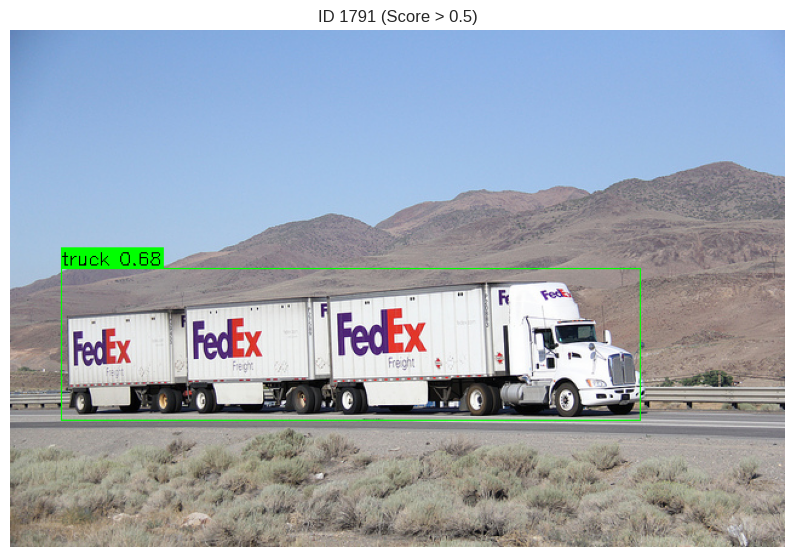

   Đã lưu: /content/drive/MyDrive/DL_Object_Detection_Train_18GB/checkpoints/predictions_clean_style/clean_kq_3078.jpg


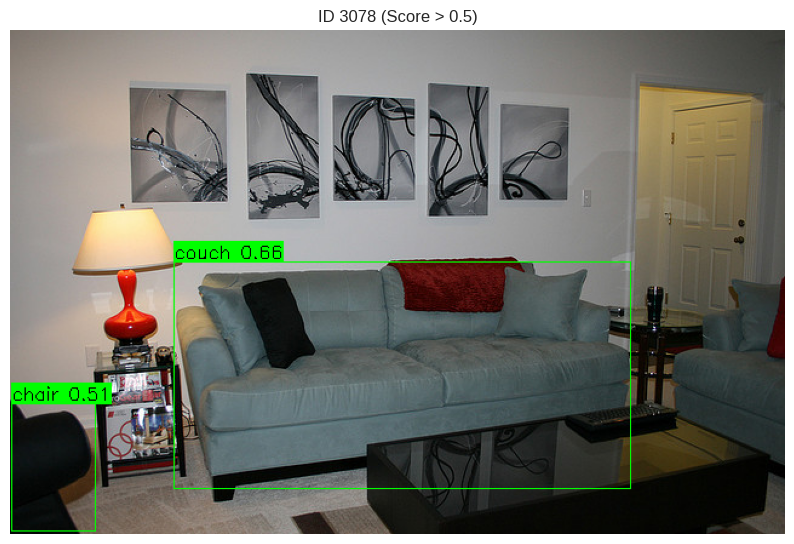

   Đã lưu: /content/drive/MyDrive/DL_Object_Detection_Train_18GB/checkpoints/predictions_clean_style/clean_kq_2056.jpg


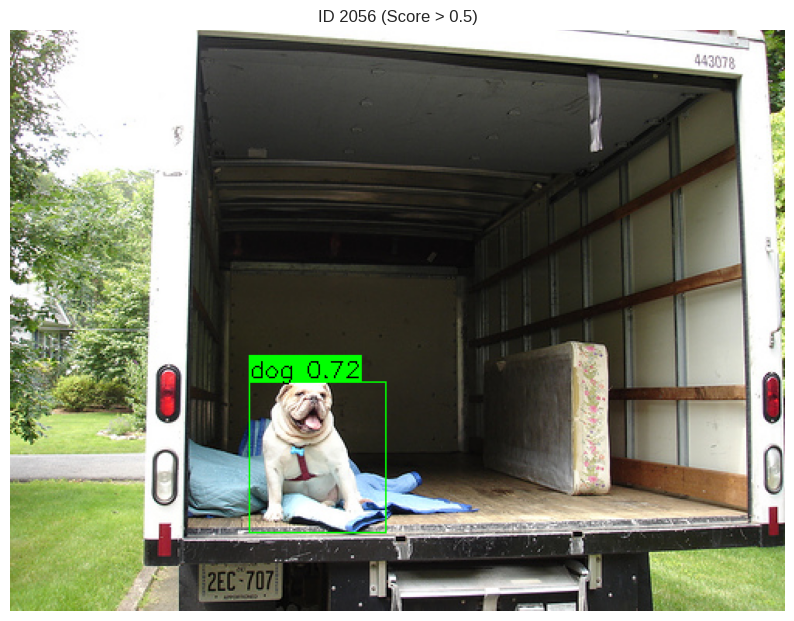

In [ ]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
import os
import random

def visualize_clean_style(model, dataset_to_test, count=3, threshold=0.5):
    dataset_len = len(dataset_to_test)
    if dataset_len == 0:
        print("Lỗi: Dataset rỗng!")
        return

    model.eval()

    COCO_INSTANCE_CATEGORY_NAMES = [
        '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
        'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
        'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
        'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
        'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
        'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
        'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
        'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
        'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
        'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
        'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
        'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
    ]

    save_dir = os.path.join(checkpoint_dir, 'predictions_clean_style')
    os.makedirs(save_dir, exist_ok=True)

    # Lấy index ngẫu nhiên
    indices = random.sample(range(dataset_len), min(count, dataset_len))
    print(f"Đang kiểm tra ảnh ID: {indices}")

    for i, idx in enumerate(indices):
        img_tensor, _ = dataset_to_test[idx]

        with torch.no_grad():
            prediction = model(img_tensor.unsqueeze(0).to(device))[0]

        # Chuyển ảnh sang Numpy (H, W, C)
        img_np = img_tensor.permute(1, 2, 0).cpu().numpy()
        img_np = (img_np * 255).astype(np.uint8)
        # Chuyển BGR để dùng OpenCV
        img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)

        # Lấy kích thước ảnh để tính tỉ lệ nét vẽ
        h_img, w_img = img_bgr.shape[:2]
        # Tự động chỉnh độ dày nét theo size ảnh (ảnh càng to nét càng dày cho rõ)
        thickness = max(1, int(min(h_img, w_img) * 0.003))
        font_scale = max(0.5, min(h_img, w_img) * 0.0008) # Font to vừa phải

        for j in range(len(prediction['boxes'])):
            score = prediction['scores'][j].item()

            if score > threshold:
                box = prediction['boxes'][j].cpu().numpy().astype(int)
                label_id = prediction['labels'][j].item()
                label_name = COCO_INSTANCE_CATEGORY_NAMES[label_id] if label_id < len(COCO_INSTANCE_CATEGORY_NAMES) else f"ID_{label_id}"

                # Màu sắc: Xanh lá (Green)
                color = (0, 255, 0)

                # 1. Vẽ khung chữ nhật (Bbox)
                cv2.rectangle(img_bgr, (box[0], box[1]), (box[2], box[3]), color, thickness)

                # 2. Xử lý chữ (Label)
                caption = f"{label_name} {score:.2f}"

                # Lấy kích thước chữ
                (t_w, t_h), _ = cv2.getTextSize(caption, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)

                #  KHẮC PHỤC CHE HÌNH
                # Tính toán vị trí nền chữ: Ưu tiên vẽ LÊN TRÊN đầu box
                # Nếu box sát mép trên cùng ảnh quá thì mới vẽ vào trong hoặc xuống dưới

                # Tọa độ góc trên bên trái của Box
                x1, y1 = box[0], box[1]

                # Mặc định vẽ nền chữ ở phía trên (y1 - t_h)
                bg_y1 = y1 - t_h - 5
                bg_y2 = y1

                # Nếu bị tràn khỏi ảnh (bg_y1 < 0) thì vẽ vào trong box (như cũ nhưng gọn hơn)
                if bg_y1 < 0:
                    bg_y1 = y1
                    bg_y2 = y1 + t_h + 5
                    text_y = y1 + t_h + 2
                else:
                    text_y = y1 - 3

                # Vẽ nền chữ (Background)
                cv2.rectangle(img_bgr, (x1, bg_y1), (x1 + t_w, bg_y2), color, -1) # -1 là tô kín (filled)

                # Viết chữ (Màu đen/Black cho dễ đọc trên nền xanh)
                cv2.putText(img_bgr, caption, (x1, text_y),
                            cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0), thickness)

        # Lưu ảnh
        save_path = os.path.join(save_dir, f"clean_kq_{idx}.jpg")
        cv2.imwrite(save_path, img_bgr)
        print(f"   Đã lưu: {save_path}")

        # Hiển thị (Resize về một cỡ cố định để hiển thị trên màn hình cho không bị vỡ)
        # Chỉ để view trên notebook, file ảnh gốc vẫn giữ nguyên size xịn
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(f"ID {idx} (Score > {threshold})", fontsize=12)
        plt.show()

# CHẠY THỬ
if 'val_dataset' in globals():
    visualize_clean_style(model, val_dataset, count=3, threshold=0.5)
elif 'val_loader' in globals():
    visualize_clean_style(model, val_loader.dataset, count=3, threshold=0.5)
else:
    print("Chưa có dataset!")

# **Step7: Phân tích lỗi sai (Error Analysis)**

* Màu Xanh Lá (Green): Ground Truth (Đáp án đúng - Thực tế).
* Màu Đỏ (Red): Prediction (Model dự đoán).

Đang kiểm tra ảnh ID: [3597, 4438, 1883]


/tmp/ipython-input-4150555088.py:97: UserWarning: Glyph 7852 (\N{LATIN CAPITAL LETTER A WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-4150555088.py:97: UserWarning: Glyph 7920 (\N{LATIN CAPITAL LETTER U WITH HORN AND DOT BELOW}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-4150555088.py:97: UserWarning: Glyph 7871 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7852 (\N{LATIN CAPITAL LETTER A WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 7920 (\N{LATIN CAPITAL LETTER U WITH HORN AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/

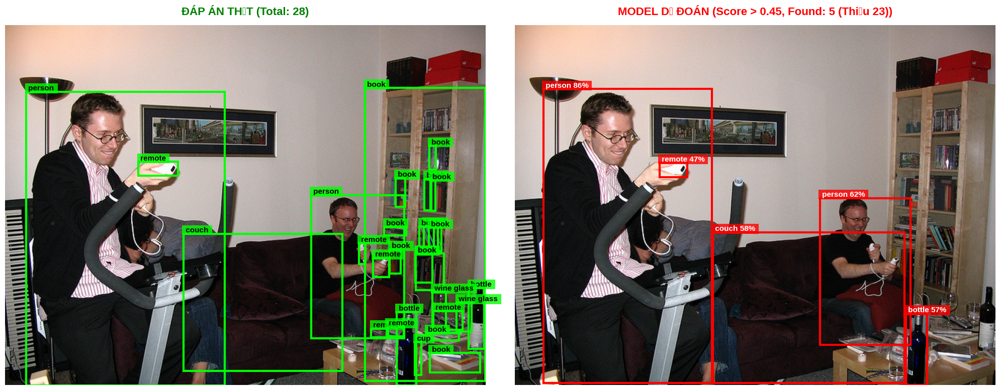

/tmp/ipython-input-4150555088.py:99: UserWarning: Glyph 7852 (\N{LATIN CAPITAL LETTER A WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.savefig(os.path.join(save_dir, f"count_result_{idx}.jpg"), bbox_inches='tight')
/tmp/ipython-input-4150555088.py:99: UserWarning: Glyph 7920 (\N{LATIN CAPITAL LETTER U WITH HORN AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.savefig(os.path.join(save_dir, f"count_result_{idx}.jpg"), bbox_inches='tight')
/tmp/ipython-input-4150555088.py:99: UserWarning: Glyph 7871 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans.
  fig.savefig(os.path.join(save_dir, f"count_result_{idx}.jpg"), bbox_inches='tight')
/tmp/ipython-input-4150555088.py:99: UserWarning: Glyph 7852 (\N{LATIN CAPITAL LETTER A WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.savefig(os.path.join(save_dir, f"count_result_{idx}.jpg"), bbox_inches='tight')
/tmp/ipython-input-4150555088.py:99:

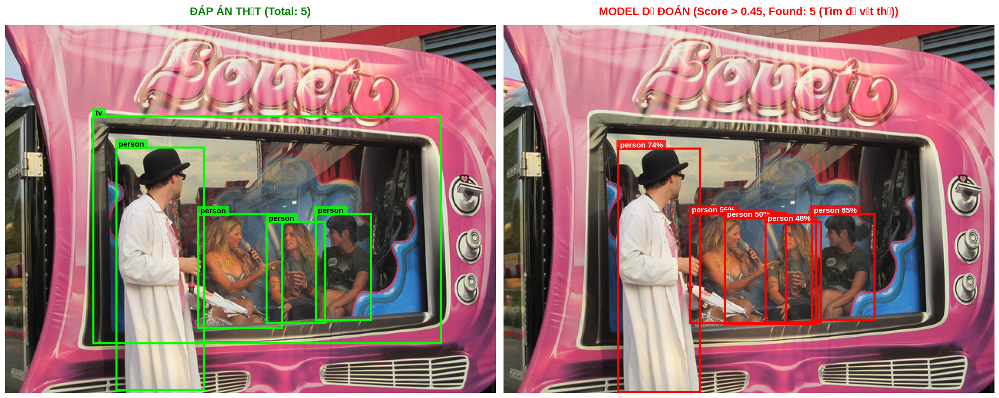

/tmp/ipython-input-4150555088.py:99: UserWarning: Glyph 7852 (\N{LATIN CAPITAL LETTER A WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.savefig(os.path.join(save_dir, f"count_result_{idx}.jpg"), bbox_inches='tight')
/tmp/ipython-input-4150555088.py:99: UserWarning: Glyph 7920 (\N{LATIN CAPITAL LETTER U WITH HORN AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.savefig(os.path.join(save_dir, f"count_result_{idx}.jpg"), bbox_inches='tight')
/tmp/ipython-input-4150555088.py:99: UserWarning: Glyph 7911 (\N{LATIN SMALL LETTER U WITH HOOK ABOVE}) missing from font(s) Liberation Sans.
  fig.savefig(os.path.join(save_dir, f"count_result_{idx}.jpg"), bbox_inches='tight')
/tmp/ipython-input-4150555088.py:99: UserWarning: Glyph 7853 (\N{LATIN SMALL LETTER A WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.savefig(os.path.join(save_dir, f"count_result_{idx}.jpg"), bbox_inches='tight')
/tmp/ipython-input-4150555088.py:99: UserWarning

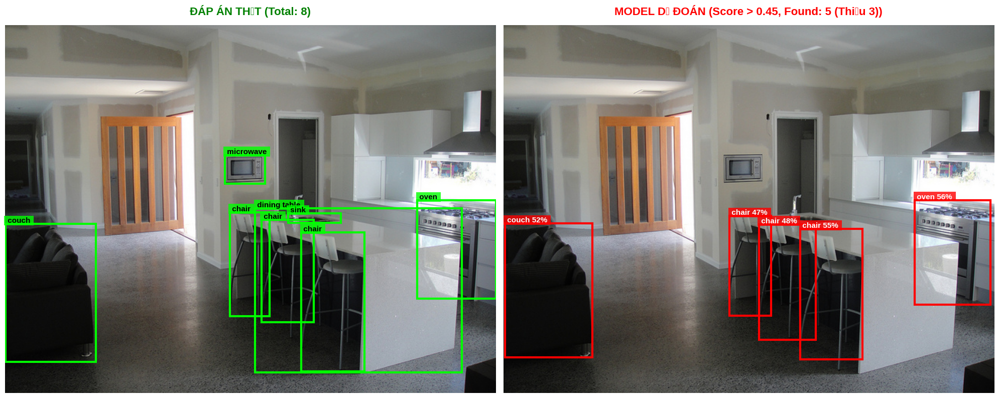

/tmp/ipython-input-4150555088.py:99: UserWarning: Glyph 7852 (\N{LATIN CAPITAL LETTER A WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.savefig(os.path.join(save_dir, f"count_result_{idx}.jpg"), bbox_inches='tight')
/tmp/ipython-input-4150555088.py:99: UserWarning: Glyph 7920 (\N{LATIN CAPITAL LETTER U WITH HORN AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.savefig(os.path.join(save_dir, f"count_result_{idx}.jpg"), bbox_inches='tight')
/tmp/ipython-input-4150555088.py:99: UserWarning: Glyph 7871 (\N{LATIN SMALL LETTER E WITH CIRCUMFLEX AND ACUTE}) missing from font(s) Liberation Sans.
  fig.savefig(os.path.join(save_dir, f"count_result_{idx}.jpg"), bbox_inches='tight')
/tmp/ipython-input-4150555088.py:99: UserWarning: Glyph 7852 (\N{LATIN CAPITAL LETTER A WITH CIRCUMFLEX AND DOT BELOW}) missing from font(s) Liberation Sans.
  fig.savefig(os.path.join(save_dir, f"count_result_{idx}.jpg"), bbox_inches='tight')
/tmp/ipython-input-4150555088.py:99:

In [ ]:
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import torch
import os

# Từ điển tên Class
COCO_CLASS_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

def visualize_with_counts(model, dataset, device, count=3, score_threshold=0.5):
    model.eval()

    total_imgs = len(dataset)
    indices = random.sample(range(total_imgs), min(count, total_imgs))
    print(f"Đang kiểm tra ảnh ID: {indices}")

    save_dir = os.path.join(checkpoint_dir, 'visualize_counts')
    os.makedirs(save_dir, exist_ok=True)

    for i, idx in enumerate(indices):
        img_tensor, target = dataset[idx]

        with torch.no_grad():
            prediction = model([img_tensor.to(device)])[0]

        img_numpy = img_tensor.cpu().numpy().transpose(1, 2, 0)
        img_numpy = np.clip(img_numpy, 0, 1)

        num_gt = len(target['boxes'])
        pred_scores = prediction['scores'].cpu().numpy()
        keep = pred_scores >= score_threshold
        num_pred = np.sum(keep)

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

        # HÌNH TRÁI: ĐÁP ÁN THẬT
        ax1.imshow(img_numpy)
        ax1.set_title(f"ĐÁP ÁN THẬT (Total: {num_gt})", color='green', fontsize=16, fontweight='bold', pad=15)
        ax1.axis('off')

        for box, label in zip(target['boxes'].cpu().numpy(), target['labels'].cpu().numpy()):
            x1, y1, x2, y2 = box
            w, h = x2 - x1, y2 - y1
            name = COCO_CLASS_NAMES[label] if label < len(COCO_CLASS_NAMES) else str(label)

            rect = patches.Rectangle((x1, y1), w, h, linewidth=3, edgecolor='#00FF00', facecolor='none')
            ax1.add_patch(rect)
            ax1.text(x1, y1, f" {name} ", color='black', fontsize=11, fontweight='bold',
                     verticalalignment='bottom', bbox={'facecolor': '#00FF00', 'alpha': 0.8, 'pad': 2, 'edgecolor': 'none'})

        # HÌNH PHẢI: MODEL DỰ ĐOÁN
        ax2.imshow(img_numpy)

        if num_pred == num_gt:
            status = "(Tìm đủ vật thể)"
        elif num_pred < num_gt:
            status = f"(Thiếu {num_gt - num_pred})"
        else:
            status = f"(Dư {num_pred - num_gt})"

        ax2.set_title(f"MODEL DỰ ĐOÁN (Score > {score_threshold}, Found: {num_pred} {status})", color='red', fontsize=16, fontweight='bold', pad=15)
        ax2.axis('off')

        pred_boxes = prediction['boxes'].cpu().numpy()
        pred_labels = prediction['labels'].cpu().numpy()

        if num_pred == 0:
             ax2.text(0.5, 0.5, "Không thấy gì!", color='white', fontsize=20,
                      ha='center', backgroundcolor='black')
        else:
            for box, score, label in zip(pred_boxes[keep], pred_scores[keep], pred_labels[keep]):
                x1, y1, x2, y2 = box
                w, h = x2 - x1, y2 - y1

                name = COCO_CLASS_NAMES[label] if label < len(COCO_CLASS_NAMES) else str(label)
                label_text = f" {name} {score:.0%} "

                rect = patches.Rectangle((x1, y1), w, h, linewidth=3, edgecolor='red', facecolor='none')
                ax2.add_patch(rect)
                ax2.text(x1, y1, label_text, color='white', fontsize=11, fontweight='bold',
                         verticalalignment='bottom', bbox={'facecolor': 'red', 'alpha': 0.8, 'pad': 2, 'edgecolor': 'none'})

        plt.tight_layout()
        plt.show()
        fig.savefig(os.path.join(save_dir, f"count_result_{idx}.jpg"), bbox_inches='tight')

# CHẠY THỬ
if 'val_loader' in globals():
    visualize_with_counts(model, val_loader.dataset, device, count=3, score_threshold=0.45)
else:
    print("Vui lòng chạy lại các bước Setup Data phía trên.")

# **Step 8: Calculate mAP - Đánh giá mAP**


Hàm dưới đây sẽ thực hiện đánh giá chi tiết theo chuẩn COCO (COCO-Style Evaluation) để tính ra các chỉ số quan trọng:
- **mAP (Average Precision @ IoU=0.50:0.95)**: Độ chính xác trung bình trên nhiều ngưỡng IoU.
- **AP50 (Average Precision @ IoU=0.50)**: Độ chính xác khi yêu cầu IoU > 0.5.



In [ ]:
# Cài đặt hoặc Import thư viện COCO API
try:
    from pycocotools.coco import COCO
    from pycocotools.cocoeval import COCOeval
except ImportError:
    print("Đang cài đặt pycocotools...")
    !pip install pycocotools
    from pycocotools.coco import COCO
    from pycocotools.cocoeval import COCOeval

from tqdm import tqdm
import json
import os

def evaluate_coco_map(model, loader, device):
    model.eval()
    results = []

    print(f"Đang chạy đánh giá trên {len(loader.dataset)} ảnh Validation...")

    with torch.no_grad():
        # Dùng tqdm để hiện thanh tiến trình cho đỡ sốt ruột
        for images, targets in tqdm(loader, desc="Evaluating"):
            images = list(img.to(device) for img in images)

            # Chạy dự đoán
            outputs = model(images)

            # Đưa output về CPU để xử lý
            outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]

            for i, output in enumerate(outputs):
                # Lấy image_id gốc từ target để khớp với file annotation
                img_id = targets[i]['image_id'].item()

                boxes = output['boxes'].tolist()
                scores = output['scores'].tolist()
                labels = output['labels'].tolist()

                for box, score, label in zip(boxes, scores, labels):
                    # Convert box từ [x1, y1, x2, y2] sang [x, y, w, h] (Format COCO yêu cầu)
                    x1, y1, x2, y2 = box
                    w = x2 - x1
                    h = y2 - y1

                    results.append({
                        'image_id': img_id,
                        'category_id': label,
                        'bbox': [x1, y1, w, h],
                        'score': score
                    })

    if len(results) == 0:
        print("CẢNH BÁO: Model không phát hiện được vật thể nào! (mAP = 0)")
        print("Gợi ý: Kiểm tra lại quá trình train, hoặc giảm ngưỡng score_threshold.")
        return

    # Ghi kết quả dự đoán ra file JSON tạm
    result_file = os.path.join(checkpoint_dir, 'val_predictions.json')
    with open(result_file, 'w') as f:
        json.dump(results, f)
    print(f"Đã lưu file dự đoán tại: {result_file}")

    # --- KHỞI CHẠY COCO EVAL ---
    print("\nKẾT QUẢ ĐÁNH GIÁ (COCO EVALUATION):")

    # Load Ground Truth (Đáp án thật) từ Dataset
    cocoGt = loader.dataset.coco

    # Load Predictions (Bài làm của Model) từ file JSON
    try:
        cocoDt = cocoGt.loadRes(result_file)
    except Exception as e:
        print(f"Lỗi khi load kết quả: {e}")
        return

    # Chạy đánh giá BBox
    cocoEval = COCOeval(cocoGt, cocoDt, 'bbox')

    # Chỉ đánh giá trên các ảnh có trong tập Val hiện tại (nếu dùng dataset nhỏ)
    cocoEval.params.imgIds = sorted([img_id for img_id in cocoGt.imgs.keys()])

    cocoEval.evaluate()
    cocoEval.accumulate()
    cocoEval.summarize()

# GỌI HÀM VỚI VAL_LOADER (Tập kiểm thử)
evaluate_coco_map(model, val_loader, device)

Đang chạy đánh giá trên 5000 ảnh Validation...


Evaluating: 100%|██████████| 1250/1250 [04:41<00:00,  4.44it/s]


Đã lưu file dự đoán tại: /content/drive/MyDrive/DL_Object_Detection_Train_18GB/checkpoints/val_predictions.json

KẾT QUẢ ĐÁNH GIÁ (COCO EVALUATION):
Loading and preparing results...
DONE (t=10.84s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=79.23s).
Accumulating evaluation results...
DONE (t=17.19s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.270
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.431
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.280
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.106
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.305
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.410
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.266
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.